In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import datetime
import logging
import math
import pathlib
from typing import Any

import gpm.utils.geospatial
import matplotlib.pyplot as plt
import numpy as np
import polars as pl
from scipy.signal import find_peaks, find_peaks_cwt, peak_widths

from pmw_analysis.analysis.spatial_visualization import plot_variables_on_map
from pmw_analysis.constants import COLUMN_LON, COLUMN_LAT, FILE_DF_FINAL_NEWEST, \
    DIR_IMAGES, ArgSurfaceType, VARIABLE_SURFACE_TYPE_INDEX, FILE_DF_FINAL_OLDEST, COLUMN_TIME, FILE_DF_FINAL, \
    COLUMN_OCCURRENCE, Stats, COLUMN_COUNT, COLUMN_GPM_ID, COLUMN_GPM_CROSS_TRACK_ID, COLUMN_SUFFIX_QUANT, \
    FILE_DF_FINAL_RAREST
from pmw_analysis.constants import DIR_PMW_ANALYSIS, TC_COLUMNS, ArgTransform
from pmw_analysis.processing.filter import filter_by_signature_occurrences_count, filter_by_flag_values, \
    filter_by_value_range
from pmw_analysis.quantization.dataframe_polars import expand_occurrence_column, get_uncertainties_dict
from pmw_analysis.quantization.script import get_transformation_function
from pmw_analysis.utils.io import combine_paths, file_to_dir
from pmw_analysis.utils.logging import timing

In [3]:
arg_transform = ArgTransform.V4
arg_surface_type = ArgSurfaceType.LAND
df_dir_path = pathlib.Path(DIR_PMW_ANALYSIS) / arg_transform.value / arg_surface_type.value

transform = get_transformation_function(arg_transform)
quant_columns = transform(TC_COLUMNS)

# df_all = pl.read_parquet(df_dir_path / FILE_DF_FINAL)
# print(f"{df_all.select(pl.col(COLUMN_COUNT).cast(pl.UInt64).sum()).item()} -> {df_all.height}")

# df_newest_path = df_dir_path / FILE_DF_FINAL_NEWEST
# df_oldest_path = df_dir_path / FILE_DF_FINAL_OLDEST

flag_peaks = True
flag_with_greenland = True

logging.basicConfig(level=logging.INFO)

# extent = gpm.utils.geospatial.get_country_extent("Greenland")
extent = None

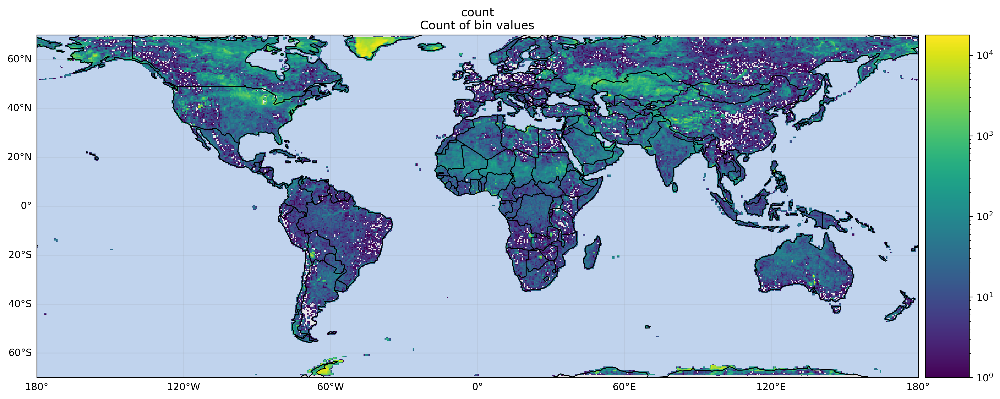

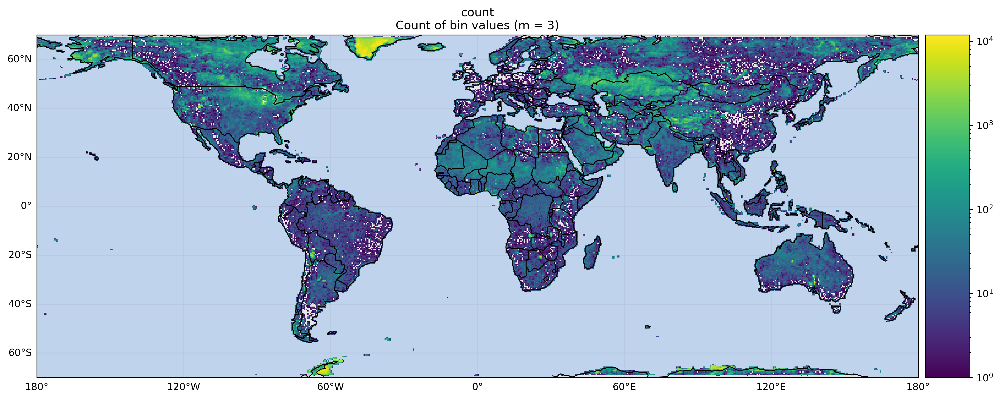

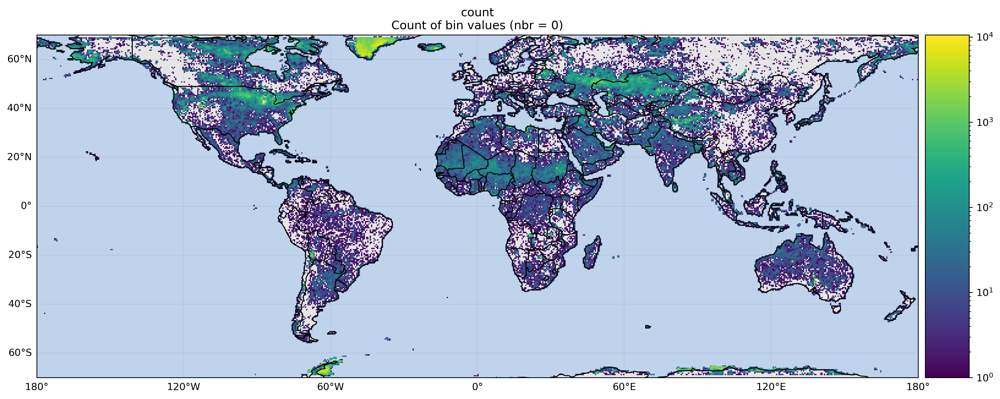

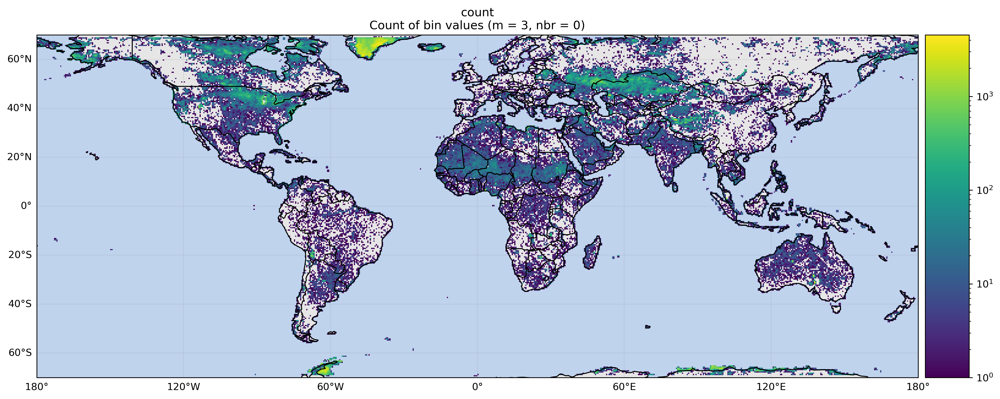

INFO:root:Calculating took 24.361 seconds.


In [14]:
df_path = df_dir_path / f"{FILE_DF_FINAL_RAREST[:FILE_DF_FINAL_RAREST.find('.')]}_nbr_count.parquet"
# df_path = df_dir_path / f"{FILE_DF_FINAL_NEWEST[:FILE_DF_FINAL_RAREST.find('.')]}_nbr_count.parquet"

df = pl.read_parquet(df_path)
images_dir = combine_paths(path_base=pathlib.Path("..") / DIR_IMAGES, path_rel=file_to_dir(df_path), path_rel_base=DIR_PMW_ANALYSIS)
images_dir.mkdir(parents=True, exist_ok=True)

df = df.with_columns(pl.lit(1).alias(COLUMN_COUNT))
with timing("Calculating"):
    # Only consider signatures that appeared at least a specified number of times
    m_occurrences = 3
    df_m = filter_by_signature_occurrences_count(df, m_occurrences, quant_columns)

    df_nbr_0 = filter_by_value_range(df, "nbr_count_1", (0, 1))
    df_nbr_1 = filter_by_value_range(df, "nbr_count_1", (0, 2))

    df_m_nbr_0 = filter_by_value_range(df_m, "nbr_count_1", (0, 1))
    df_m_nbr_1 = filter_by_value_range(df_m, "nbr_count_1", (0, 2))

    columns_to_plot = [COLUMN_LON, COLUMN_LAT, COLUMN_COUNT]

    plot_variables_on_map(df[columns_to_plot], arg_transform, images_dir)
    plot_variables_on_map(df_m[columns_to_plot], arg_transform, images_dir, title_text_suffix=f" (m = {m_occurrences})", file_name_suffix=f"_m_{m_occurrences}")
    plot_variables_on_map(df_nbr_0[columns_to_plot], arg_transform, images_dir, title_text_suffix=" (nbr = 0)", file_name_suffix="_nbr_0")
    # plot_variables_on_map(df_nbr_1[columns_to_plot], arg_transform, images_dir, title_text_suffix=" (nbr = 1)")
    plot_variables_on_map(df_m_nbr_0[columns_to_plot], arg_transform, images_dir, title_text_suffix=f" (m = {m_occurrences}, nbr = 0)", file_name_suffix=f"_m_{m_occurrences}_nbr_0")
    # plot_variables_on_map(df_m_nbr_1[columns_to_plot], arg_transform, images_dir, title_text_suffix=f" (m = {m_occurrences}, nbr = 1)")

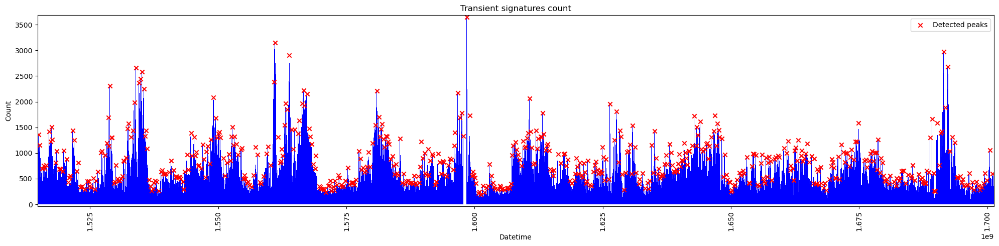

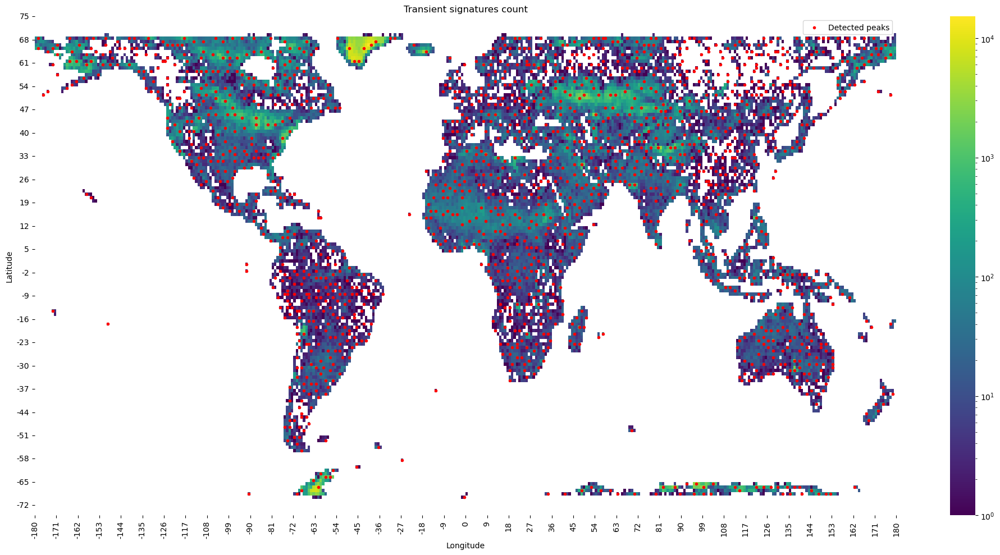

In [15]:
from examples.signatures_evolution import _detect_peaks

bin_sizes_time = {COLUMN_TIME: datetime.timedelta(days=1)}
bin_ranges_time = {}

peaks_time = _detect_peaks(df_m_nbr_0[[COLUMN_TIME]], bin_sizes_time, bin_ranges_time, images_dir)

bin_sizes_lon_lat = {COLUMN_LON: 1, COLUMN_LAT: 1}
bin_ranges_lon_lat = {COLUMN_LON: (-180, 180), COLUMN_LAT: (-75, 75)}

peaks_lon_lat = _detect_peaks(df_m_nbr_0[[COLUMN_LON, COLUMN_LAT]], bin_sizes_lon_lat, bin_ranges_lon_lat, images_dir)

In [16]:
from pmw_analysis.processing.filter import get_filter_expr_from_value_range
from examples.signatures_evolution import take_k_peaks_by_zones
from gpm.utils.geospatial import Extent

zones = pl.Series(np.zeros(len(df_m_nbr_0), dtype=int))
extent_greenland = Extent(xmin=-60, xmax=0, ymin=60, ymax=90)  # gpm.utils.geospatial.get_country_extent("Greenland")
extent_antarctic = Extent(xmin=-180, xmax=180, ymin=-90, ymax=-60)
for i, extent in enumerate([extent_greenland, extent_antarctic]):
    filter_expr = get_filter_expr_from_value_range([COLUMN_LON, COLUMN_LAT], np.array(extent).reshape((2, 2)))
    zones = df_m_nbr_0.select(pl.when(filter_expr).then(pl.lit(i + 1)).otherwise(zones)).to_series()

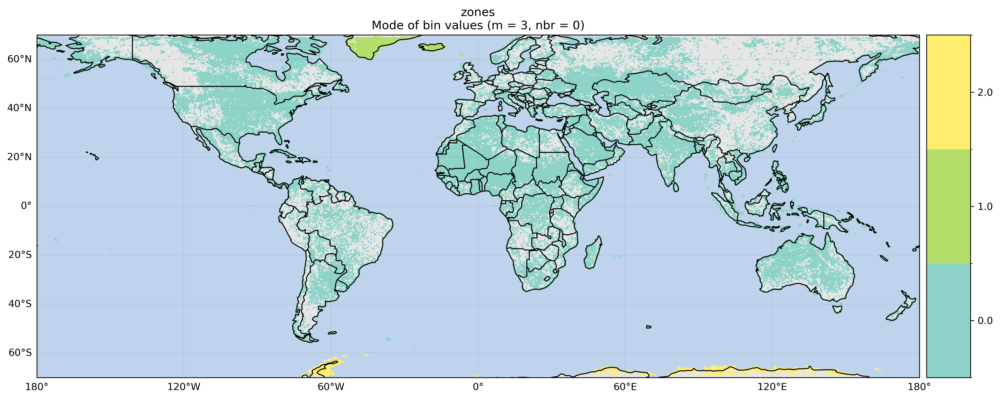

In [17]:
columns_to_plot = [COLUMN_LON, COLUMN_LAT, "zones"]
plot_variables_on_map(df_m_nbr_0.with_columns(zones.alias("zones"))[columns_to_plot], arg_transform, images_dir,
                      title_text_suffix=f" (m = {m_occurrences}, nbr = 0)",
                      file_name_suffix=f"_m_{m_occurrences}_nbr_0")

shape: (12, 2)
┌───────┬───────┐
│ peaks ┆ count │
│ ---   ┆ ---   │
│ i64   ┆ u32   │
╞═══════╪═══════╡
│ 111   ┆ 1999  │
│ 439   ┆ 1679  │
│ 324   ┆ 1578  │
│ 123   ┆ 1456  │
│ 441   ┆ 1456  │
│ …     ┆ …     │
│ 211   ┆ 1370  │
│ 21    ┆ 1352  │
│ 425   ┆ 1347  │
│ 442   ┆ 1346  │
│ 438   ┆ 1294  │
└───────┴───────┘
shape: (4, 2)
┌───────┬───────┐
│ peaks ┆ count │
│ ---   ┆ ---   │
│ i64   ┆ u32   │
╞═══════╪═══════╡
│ 273   ┆ 3395  │
│ 147   ┆ 2790  │
│ 588   ┆ 2737  │
│ 156   ┆ 2604  │
└───────┴───────┘
shape: (4, 2)
┌───────┬───────┐
│ peaks ┆ count │
│ ---   ┆ ---   │
│ i64   ┆ u32   │
╞═══════╪═══════╡
│ 210   ┆ 1399  │
│ 214   ┆ 1081  │
│ 213   ┆ 1008  │
│ 209   ┆ 963   │
└───────┴───────┘
shape: (4, 2)
┌───────┬───────┐
│ peaks ┆ count │
│ ---   ┆ ---   │
│ i64   ┆ u32   │
╞═══════╪═══════╡
│ 4     ┆ 8378  │
│ 8     ┆ 4822  │
│ 10    ┆ 4140  │
│ 13    ┆ 3638  │
└───────┴───────┘
shape: (4, 2)
┌───────┬───────┐
│ peaks ┆ count │
│ ---   ┆ ---   │
│ i64   ┆ u32   │
╞═══════╪══

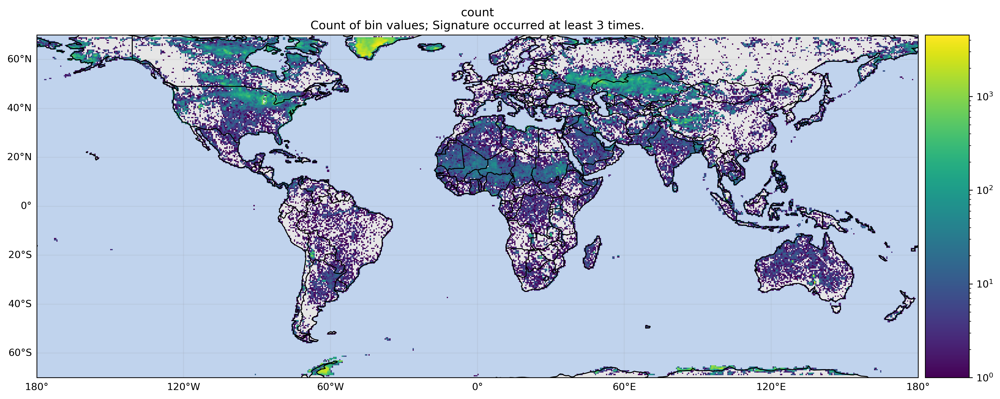

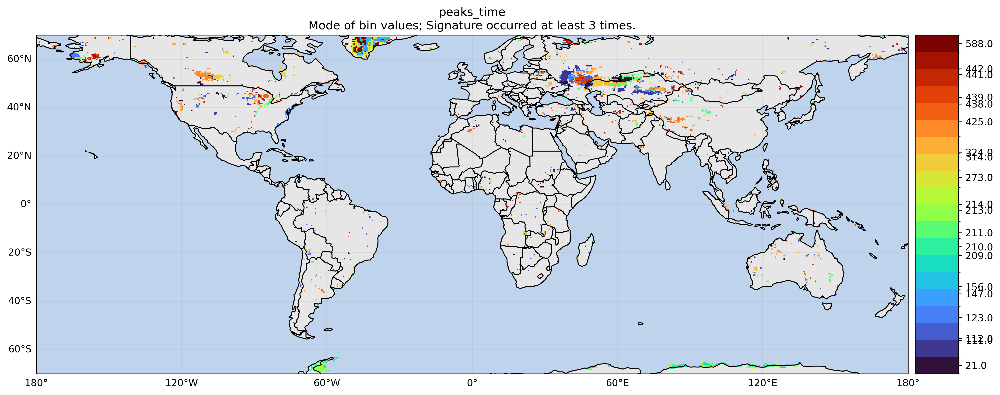

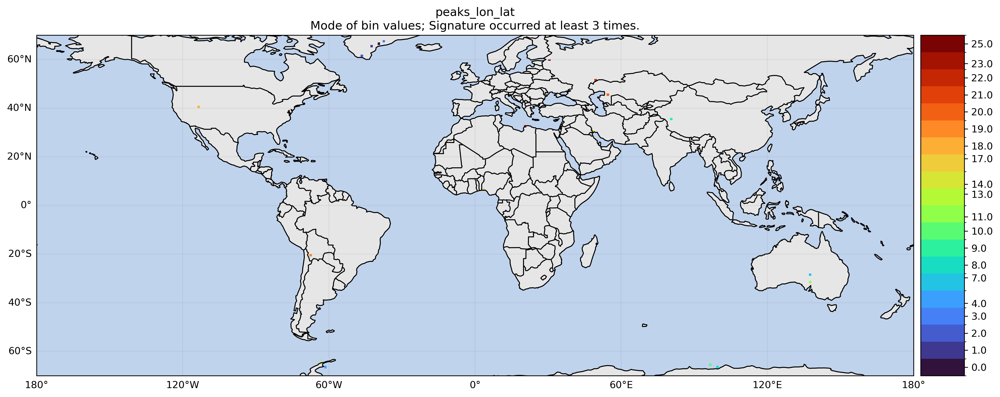

INFO:root:Plotting on map took 8.732 seconds.


In [18]:
k = {0: 12, 1: 4, 2: 4}
peaks_time_10 = take_k_peaks_by_zones(peaks_time, k, zones)
peaks_lon_lat_10 = take_k_peaks_by_zones(peaks_lon_lat, k, zones)

df_m_nbr_0 = df_m_nbr_0.with_columns(peaks_time_10.to_series().alias("peaks_time"))
df_m_nbr_0 = df_m_nbr_0.with_columns(peaks_lon_lat_10.to_series().alias("peaks_lon_lat"))

columns_to_plot = [COLUMN_LON, COLUMN_LAT, COLUMN_COUNT]
columns_to_plot += ["peaks_time", "peaks_lon_lat"]
with timing("Plotting on map"):
    m_occurrences_text = "" if m_occurrences == 1 else f"; Signature occurred at least {m_occurrences} times."
    # peaks_suffix = "" if not flag_peaks else "_peaks"
    # greenland_suffix = "" if flag_with_greenland else "_no_greenland"
    plot_variables_on_map(df_m_nbr_0[columns_to_plot], arg_transform,
                          images_dir=images_dir,
                          title_text_suffix=m_occurrences_text,
                          file_name_suffix=f"_m_{m_occurrences}_nbr_0_peaks",
                          # file_name_suffix=f"_{m_occurrences}{peaks_suffix}{greenland_suffix}_{value_range[0]}_{value_range[1]}",
                          extent=None,
                          threshold_cat=20)
# df_m.write_parquet(df_path.parent / f"{df_path.stem}_peaks.parquet")

In [21]:
df_m_nbr_0.write_parquet(df_dir_path / f"{df_path.stem}_0_m_{m_occurrences}_peaks.parquet")